# Clustering analysis  

### The aim of this study was to determine whether there are any clusters inside the venus or not. As the clustering algorithm K-means++ was chosen due to its simplicity and efficiency. As the main metric for choosing the correct number of clusters (K), WSS (within clusters sums of squares) and silhouette score were chosen. (tady muzeme citovat napr: https://www.oreilly.com/library/view/practical-statistics-for/9781491952955/ (strana 294-304) a asi by chtelo ocitovat i tu knihovnu pro ten algorithmus (https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html)). At first, clustering was applied to all particles no matter what size. This approach did not bring any significant results as the size of the most particles is extremely small and on top of that, there was a huge overlap among individual clusters. Afterwards, we have decided to take a more reasonable approach by focusing solely on particles with volume greater than or equal to 2 mm^3 (in total 69 particles). This threshold was set as the minimum possible particle volume (size) that could have been exposed to the intentional human manipulation in terms of technological or symbolical purposes. Firstly, only particle coordinates (BaryCenters) were fed into the algorithm. Based on the elbow method (using WSS metric) 2 clusters were designated. None of them brought any statistically significant result. We failed to reject all our null hypothesis related to physical features. As the main statistical test, two sample t-test was chosen to compare mean values of two distinct clusters, where first one contains 37 particles and the second on 32. The significant level (alpha) was set to 0.05 (5%). Anisotropy mean values were equal to 0.769 and 0.727 with p-value = 0.212, elongation was 0.518 and 0.526 with p-value = 0.872, flatness was 0.463 and 0.523 with p-value = 0.267 and sphericity has means equal to 0.386 and 0.415 with p-value = 0.144. Subsequently, we tried to group our particles based on their physical features. At first a PCA analysis was applied to standardised (z-score values) features from particles with volume 2 mm^3 and more. Only two components were taken into consideration as they contain together more than 80% of the total variance. Using the elbow method 3 clusters were singled out by applying K-means++ algortihm to before gained PCA scores. Given that cluster labels were attached to our original data and plot using 3D scatterplot. While the first and second clusters overlaped, the third cluster created a fairly homogeneous formation mostly in the area of the upper torso of venus. This particular cluster was distincted by high avarage value of anisotropy (0.880) and very low avarage value of flatness (0.251). Since our particle volume threshold contained only 69 particles in total, a decition was made to move our lower limit volume boundary from 2 mm^3 to 1 mm^3 in order to be able to include more particles into our analysis in terms of reducing the uncertainty of our result. The same procedure as for the particles greater than or equal to 2 mm^3 was carried out on particles including all data records with volume higher than 1 mm^3. The result clusters were far less distinct from each other from a physical perspective and their spatial distribution was rather evenly spaced without any distinct agglomerations across the figurine's body. Considering that k-means algorithm belong to so called non-deterministic (stochastic) methods and the result interpretability and the performance evaluation is not as trivial as in the case of supervised learning algorithms . As the third approach to tackle our clustering conandrum was to divide the figurine into 6 equal sized parts along vertical axes (using BarycenterZ coordinates). Particular attention was given again to particles with volume greater than or equal to 2 mm^3. Mean values of physical features were very similar across all slices and the ratio of particles with the volume greater than or equal to 2 mm^3 to all particles in a particular part of the venus were ranging between 0.34 % (the head part slice) to 0.82% (the upper torso part) without any steep fluctuation. Bearing in mind all previous methods we can claim that is unlikely that in the process of making the figuring were any internal structures created intentionally with any clear purpose.

In [149]:
import pandas as pd
import seaborn as sns 
import plotly.express as px
import matplotlib.pyplot as plt
import numpy as np

#clustering 
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from scipy.stats import stats 
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA

In [150]:
df = pd.read_csv('C:/Users/hamro/Desktop/final_table.csv')

In [151]:
all_particles = df.copy()

### all particles

In [152]:
all_particles

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,VoxelFaceArea (mm^2),Sphericity,SurfaceParticles
0,91.752900,-1249.26,-1243.58,-1685.28,0.545994,0.731435,0.620706,244.736000,0.401975,False
1,33.285200,-1241.94,-1257.46,-1686.12,0.946436,0.566783,0.094506,175.078000,0.285816,False
2,26.857600,-1246.98,-1235.86,-1648.17,0.862477,0.343091,0.400835,194.946000,0.222475,False
3,20.575500,-1249.24,-1250.28,-1680.69,0.844642,0.736602,0.210912,94.278900,0.385156,False
4,17.937600,-1242.87,-1249.47,-1647.25,0.710594,0.471159,0.614242,71.309800,0.464705,False
...,...,...,...,...,...,...,...,...,...,...
102510,0.000007,-1245.75,-1250.92,-1618.70,-1.000000,-1.000000,-1.000000,0.002151,0.805997,False
102511,0.000007,-1245.36,-1250.98,-1618.53,1.000000,0.000000,-1.000000,0.002151,0.805997,False
102512,0.000007,-1247.38,-1249.95,-1618.51,-1.000000,-1.000000,-1.000000,0.002151,0.805997,False
102513,0.000007,-1244.28,-1245.09,-1618.51,-1.000000,-1.000000,-1.000000,0.002151,0.805997,True


### all particles - descriptive stats

In [153]:
all_particles.describe()

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,VoxelFaceArea (mm^2),Sphericity
count,102515.000000,102515.000000,102515.000000,102515.000000,102515.000000,102515.000000,102515.000000,102515.000000,102515.000000
mean,0.009713,-1246.522981,-1246.863327,-1672.536396,0.676258,0.438560,0.328198,0.146898,0.658045
std,0.361543,4.688294,7.830213,25.611063,0.416351,0.406608,0.508212,1.638454,0.080128
min,0.000007,-1262.260000,-1269.460000,-1731.770000,-1.000000,-1.000000,-1.000000,0.002151,0.167262
25%,0.000048,-1249.780000,-1252.495000,-1691.630000,0.611283,0.292913,0.179971,0.009320,0.614133
50%,0.000170,-1246.460000,-1246.840000,-1672.400000,0.772373,0.499862,0.447890,0.022224,0.659861
75%,0.000618,-1243.100000,-1241.280000,-1654.175000,0.904540,0.692323,0.655831,0.055918,0.707018
max,91.752900,-1233.450000,-1225.980000,-1617.670000,1.000000,0.999980,1.000000,244.736000,0.805997


# 1: clutering only particles with volume greater than or equal to 2mm^3


In [154]:
particles_over_2 = all_particles[all_particles['Volume3d (mm^3) '] > 2]

In [155]:
particles_over_2.describe()

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,VoxelFaceArea (mm^2),Sphericity
count,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000,69.000000
mean,7.194427,-1246.532464,-1247.985072,-1673.264203,0.749591,0.522337,0.490613,43.186864,0.399711
std,11.879673,5.010710,8.228589,25.167699,0.138979,0.190592,0.223466,40.252915,0.082241
min,2.057330,-1260.040000,-1263.090000,-1720.930000,0.373645,0.141648,0.094506,15.814000,0.222475
25%,2.649340,-1249.400000,-1254.750000,-1692.350000,0.659225,0.399644,0.304423,22.947400,0.334487
50%,3.763380,-1246.280000,-1247.770000,-1669.500000,0.762504,0.492984,0.491434,29.387900,0.406799
75%,7.212370,-1242.330000,-1242.440000,-1655.430000,0.860182,0.672624,0.626743,44.775600,0.464705
max,91.752900,-1236.340000,-1229.200000,-1619.440000,0.966510,0.917335,0.959761,244.736000,0.557364


In [156]:
particles_over_2.columns

Index(['Volume3d (mm^3) ', 'BaryCenterX (mm) ', 'BaryCenterY (mm) ',
       'BaryCenterZ (mm) ', 'Anisotropy', 'Elongation', 'Flatness',
       'VoxelFaceArea (mm^2)', 'Sphericity', 'SurfaceParticles'],
      dtype='object')

# 2: 1. particles greater than or equal to 2 mm^3; clustering based on coordinates

In [157]:
# number or possible clusters is equal to the number of points
x_coord = particles_over_2[['BaryCenterX (mm) ', 'BaryCenterY (mm) ',
       'BaryCenterZ (mm) ']]
wcss_clust = []
for i in range(1,10):
    kmeans = KMeans(i, init="k-means++", random_state=42)
    kmeans.fit(x_coord)
    wcss_clust.append(kmeans.inertia_)

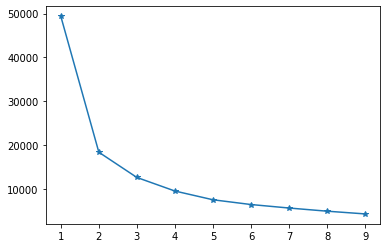

In [10]:
plt.plot(range(1,10), wcss_clust, marker = '*')

In [158]:
#silhuette score
for i in range(2,10):
    k_means_three = KMeans(n_clusters = i)
    k_means_three.fit(x_coord)
    print(f'WSS for K={i}: {k_means_three.inertia_}')
    labels_three = k_means_three.labels_
    #print(labels_three)
    print(f"{i}: {silhouette_score(x_coord, labels_three)}")

WSS for K=2: 18325.24549746622
2: 0.5036219719610647
WSS for K=3: 12557.427502093411
3: 0.3773326898682717
WSS for K=4: 9426.49948399604
4: 0.3440940235018148
WSS for K=5: 7461.9943561660475
5: 0.3474167172506071
WSS for K=6: 6570.795314660886
6: 0.3228409740059239
WSS for K=7: 5598.258385541129
7: 0.3106010471705073
WSS for K=8: 4786.76374264069
8: 0.30915176843079384
WSS for K=9: 4255.457309285719
9: 0.3372788252899918


### based on elbow method and silhouette score two clusters were identified as the ideal K

In [159]:
k_means_coordinates_2 = KMeans(n_clusters=2, init="k-means++", random_state=42)

In [160]:
k_means_coordinates_2.fit(x_coord)

KMeans(n_clusters=2, random_state=42)

In [175]:
particles_over_2['two_clust_coord'] = k_means_coordinates_2.labels_

In [178]:
particles_over_2.head()

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,VoxelFaceArea (mm^2),Sphericity,SurfaceParticles,two_clust_coord
0,91.7529,-1249.26,-1243.58,-1685.28,0.545994,0.731435,0.620706,244.7360,0.401975,False,1
1,33.2852,-1241.94,-1257.46,-1686.12,0.946436,0.566783,0.094506,175.0780,0.285816,False,1
2,26.8576,-1246.98,-1235.86,-1648.17,0.862477,0.343091,0.400835,194.9460,0.222475,False,0
3,20.5755,-1249.24,-1250.28,-1680.69,0.844642,0.736602,0.210912,94.2789,0.385156,False,1
4,17.9376,-1242.87,-1249.47,-1647.25,0.710594,0.471159,0.614242,71.3098,0.464705,False,0


In [162]:
particles_over_2.columns

Index(['Volume3d (mm^3) ', 'BaryCenterX (mm) ', 'BaryCenterY (mm) ',
       'BaryCenterZ (mm) ', 'Anisotropy', 'Elongation', 'Flatness',
       'VoxelFaceArea (mm^2)', 'Sphericity', 'SurfaceParticles',
       'two_clust_coord'],
      dtype='object')

In [165]:
import plotly.express as px

fig = px.scatter_3d(particles_over_2, x='BaryCenterX (mm) ', y='BaryCenterY (mm) ', z='BaryCenterZ (mm) ',
              color='two_clust_coord')
fig.show()

In [17]:
group_2_over_2 = particles_over_2.groupby(['two_clust_coord']).mean()

In [18]:
# number of clusters
group_2_over_2['CountTwoSegment'] = particles_over_2[['two_clust_coord','Sphericity']].groupby(['two_clust_coord']).count()

In [19]:
group_2_over_2.rename({0:'top-cluster',1:'bottom-cluster'})

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,VoxelFaceArea (mm^2),Sphericity,SurfaceParticles,CountTwoSegment
two_clust_coord,,,,,,,,,,,
top-cluster,6.217747,-1247.474324,-1248.954324,-1653.580000,0.769289,0.518836,0.462868,42.818478,0.386143,0.0,37
bottom-cluster,8.323714,-1245.443438,-1246.864375,-1696.024062,0.726815,0.526384,0.522692,43.612809,0.415398,0.0,32


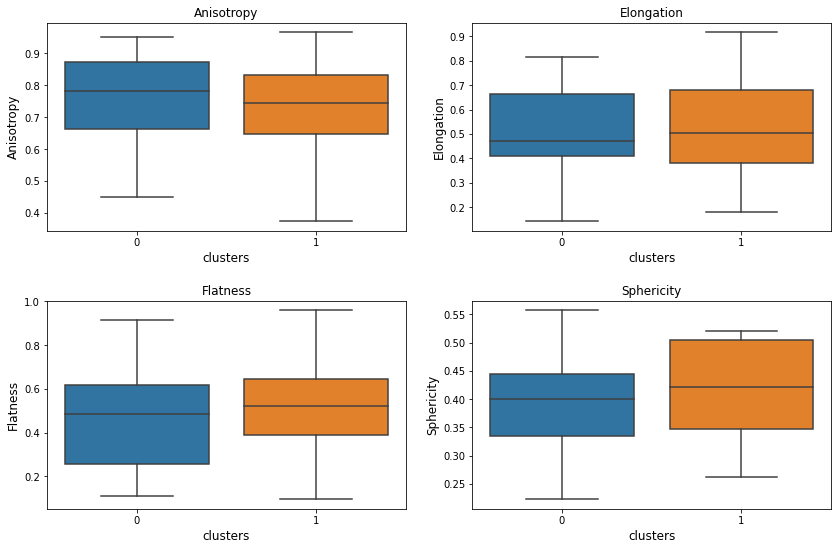

In [20]:
fig = plt.figure(figsize=(12,8))

plt.subplot(2, 2, 1)
sns.boxplot(data=particles_over_2, x='two_clust_coord',  y='Anisotropy')
plt.title("Anisotropy")
plt.xlabel('clusters', {'size':12})
plt.ylabel('Anisotropy', {'size':12})

plt.subplot(2, 2, 2)
sns.boxplot(data=particles_over_2, x='two_clust_coord',  y='Elongation')
plt.title("Elongation")
plt.xlabel('clusters', {'size':12})
plt.ylabel('Elongation', {'size':12})

plt.subplot(2, 2, 3)
sns.boxplot(data=particles_over_2, x='two_clust_coord',  y='Flatness')
plt.title("Flatness")
plt.xlabel('clusters', {'size':12})
plt.ylabel('Flatness', {'size':12})

plt.subplot(2, 2, 4)
sns.boxplot(data=particles_over_2, x='two_clust_coord',  y='Sphericity')
plt.title("Sphericity")
plt.xlabel('clusters', {'size':12})
plt.ylabel('Sphericity', {'size':12})
plt.tight_layout(pad=2)
plt.show()

##  2 sample t-test, respectively we are going to compare cluster means for anisotropy, elongation, flatness and sphericity

### significance level is set to 0.05 
### H0 - there is no difference between means of two clusters

In [21]:
clust_0 = particles_over_2[particles_over_2['two_clust_coord'] == 0]
clust_1 = particles_over_2[particles_over_2['two_clust_coord'] == 1]

In [22]:
clust_0_anis = clust_0['Anisotropy']
clust_1_anis = clust_1['Anisotropy']
res_anis = stats.ttest_ind(a= clust_0_anis,
                b= clust_1_anis,
                equal_var=False)
print("for anisotropy we cannot reject null hypothesis, p val is: ",res_anis[1])

for anisotropy we cannot reject null hypothesis, p val is:  0.21267331301420572


In [23]:
clust_0_elong = clust_0['Elongation']
clust_1_elong = clust_1['Elongation']
res_elong = stats.ttest_ind(a= clust_0_elong,
                b= clust_1_elong,
                equal_var=False)
print("for elongation we cannot reject null hypothesis, p val is: ",res_elong[1])

for elongation we cannot reject null hypothesis, p val is:  0.8722666583663269


In [24]:
clust_0_flat = clust_0['Flatness']
clust_1_flat = clust_1['Flatness']
res_flat = stats.ttest_ind(a= clust_0_flat,
                b= clust_1_flat,
                equal_var=False)
print("for flatness we cannot reject null hypothesis, p val is: ",res_flat[1])

for flatness we cannot reject null hypothesis, p val is:  0.2672472735453102


In [25]:
clust_0_spher = clust_0['Sphericity']
clust_1_spher = clust_1['Sphericity']
res_spher = stats.ttest_ind(a= clust_0_spher,
                b= clust_1_spher,
                equal_var=False)
print("for sphericity we cannot reject null hypothesis, p val is: ",res_spher[1])

for sphericity we cannot reject null hypothesis, p val is:  0.1447081316172907


# 2. 2., particles greater than or equal to 2 mm^3; clustering based on physical features (anisotropy, elongation, flatness, sphericity)

### PCA + K-means++

In [26]:
particles_over_2 = all_particles[all_particles['Volume3d (mm^3) '] > 2]

In [27]:
particles_over_2.columns

Index(['Volume3d (mm^3) ', 'BaryCenterX (mm) ', 'BaryCenterY (mm) ',
       'BaryCenterZ (mm) ', 'Anisotropy', 'Elongation', 'Flatness',
       'VoxelFaceArea (mm^2)', 'Sphericity', 'SurfaceParticles'],
      dtype='object')

In [28]:
physical_features = particles_over_2[['Anisotropy', 'Elongation', 'Flatness','Sphericity']]

In [29]:
# standardize - z scaling

scaler = StandardScaler()
physical_features_scaled = scaler.fit_transform(physical_features)

In [30]:
physical_features_scaled = pd.DataFrame(physical_features_scaled, columns=['Anisotropy', 'Elongation', 'Flatness','Sphericity'])

In [31]:
physical_features_scaled.head()

,Anisotropy,Elongation,Flatness,Sphericity
0,-1.475684,1.105135,0.586428,0.027741
1,1.426747,0.234909,-1.785549,-1.395032
2,0.818206,-0.947357,-0.404694,-2.170863
3,0.688937,1.132444,-1.260819,-0.178272
4,-0.282652,-0.270487,0.557290,0.796088


In [32]:
#initialize pca
pca = PCA()

In [33]:

pca.fit(physical_features_scaled)


PCA()

In [34]:
pca.explained_variance_ratio_

array([0.52233048, 0.29288467, 0.17665369, 0.00813115])

### two components were chosen as they capture more than 80% of all variability

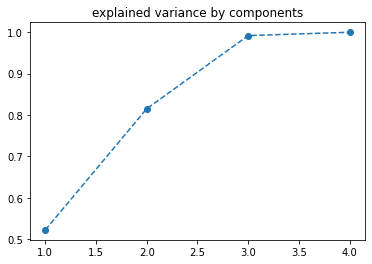

In [35]:
plt.title("explained variance by components")
plt.plot(range(1,5), pca.explained_variance_ratio_.cumsum(), marker='o', linestyle='--')
plt.show()

In [36]:
pca = PCA(n_components=2)

In [37]:
pca.fit_transform(physical_features_scaled)

array([[ 1.69784283, -0.21790518],
       [-2.28213024, -1.18545698],
       [-2.05896506,  0.80972856],
       [-0.66083809, -1.65873864],
       [ 0.68468306,  0.40273266],
       [ 0.67331076, -0.89001326],
       [-2.0922322 , -0.8317282 ],
       [-0.83328295, -0.77997422],
       [-1.02503825, -0.73004263],
       [-2.17649658,  1.78442038],
       [ 1.08190551,  0.11940239],
       [ 0.37359159,  0.09949121],
       [-1.72175425, -0.49947993],
       [ 0.95149502,  1.20933389],
       [ 1.36880417, -1.787673  ],
       [ 0.15276168, -0.30836946],
       [-0.11358878,  0.68547152],
       [ 0.71432872,  0.46914567],
       [ 1.26781765, -0.89571814],
       [-1.2759528 , -1.64637412],
       [-1.02697378,  0.0889843 ],
       [ 2.09248455, -1.2877939 ],
       [-0.02721169,  1.36540731],
       [-1.50421012,  0.04033337],
       [-0.02996312, -2.19697457],
       [ 0.40560247,  0.05797175],
       [-0.72345217, -0.09227255],
       [-0.79683288, -0.87805725],
       [-0.56286975,

In [38]:
loadings = pd.DataFrame(data=pca.components_,
                       columns=physical_features_scaled.columns,
                       index=['component1','component2'])

### loadings - correlation between pca components and original features

In [39]:
loadings

,Anisotropy,Elongation,Flatness,Sphericity
component1,-0.662029,0.398279,0.457936,0.439757
component2,-0.095712,-0.682150,0.684400,-0.238971


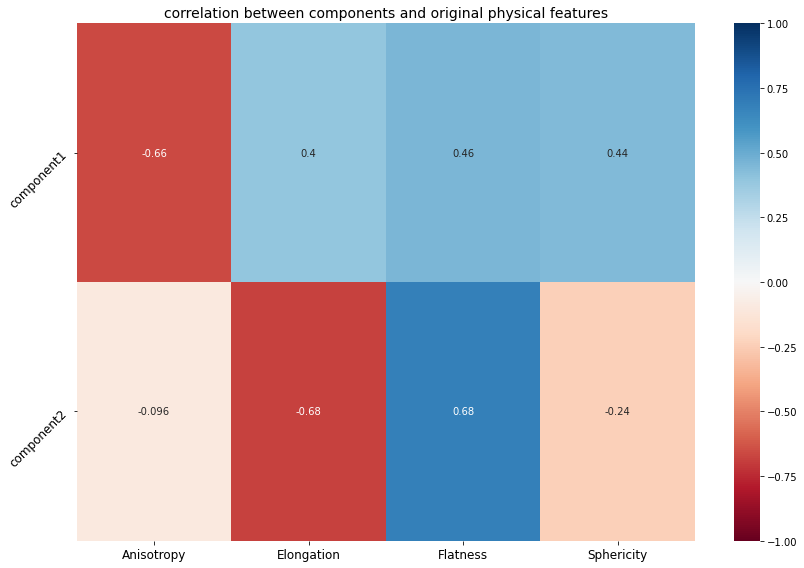

In [40]:
fig = plt.figure(figsize=(12,8))
sns.heatmap(loadings, cmap='RdBu', annot=True, vmin=-1, vmax=1)
plt.title("correlation between components and original physical features", size=14)
plt.yticks(rotation=45, size=12)
plt.xticks(size=12)
plt.tight_layout()
plt.show()

In [41]:
scores_pca = pca.fit_transform(physical_features_scaled)

### pca scores

In [42]:
print(scores_pca.shape)
scores_pca[0:5]

(69, 2)


array([[ 1.69784283, -0.21790518],
       [-2.28213024, -1.18545698],
       [-2.05896506,  0.80972856],
       [-0.66083809, -1.65873864],
       [ 0.68468306,  0.40273266]])

In [43]:
wcss_clust_pca = []
for i in range(1,10):
    kmeans = KMeans(i, init="k-means++", random_state=42)
    kmeans.fit(scores_pca)
    wcss_clust_pca.append(kmeans.inertia_)

### based on the elbow method we're choosing 3 clusters

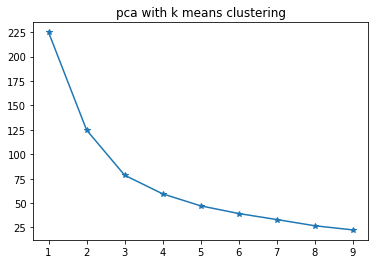

In [44]:
plt.plot(range(1,10), wcss_clust_pca, marker = '*')
plt.title("pca with k means clustering")
plt.show()

In [45]:
#silhuette score
for i in range(2,10):
    k_means_three = KMeans(n_clusters = i)
    k_means_three.fit(scores_pca)
    print(f'WSS for K={i}: {k_means_three.inertia_}')
    labels_three = k_means_three.labels_
    #print(labels_three)
    print(f"{i}: {silhouette_score(scores_pca, labels_three)}")

WSS for K=2: 124.83301256220528
2: 0.39990144134364825
WSS for K=3: 78.54270432033
3: 0.42321903979946557
WSS for K=4: 59.423630989337006
4: 0.4398274611987941
WSS for K=5: 48.89965185973766
5: 0.43945526448835415
WSS for K=6: 39.33140946590044
6: 0.39609904895579723
WSS for K=7: 30.453313410405784
7: 0.40014479991212426
WSS for K=8: 26.626543332921912
8: 0.3992686126593644
WSS for K=9: 22.492480945762843
9: 0.41380671227178123


In [46]:
k_means_physical = KMeans(n_clusters=3, init="k-means++", random_state=42)

In [47]:

k_means_physical.fit(scores_pca)

KMeans(n_clusters=3, random_state=42)

In [48]:
k_means_physical.labels_

array([0, 2, 2, 2, 1, 0, 2, 2, 2, 1, 0, 1, 2, 1, 0, 1, 1, 1, 0, 2, 2, 0,
       1, 2, 2, 1, 2, 2, 2, 1, 1, 1, 0, 2, 2, 0, 2, 1, 1, 1, 2, 2, 0, 0,
       0, 0, 0, 0, 1, 2, 1, 1, 1, 2, 1, 0, 1, 0, 2, 0, 1, 1, 2, 2, 0, 1,
       0, 1, 2])

### K-means++ clustering with PCA results

In [49]:
particles_over_2.columns

Index(['Volume3d (mm^3) ', 'BaryCenterX (mm) ', 'BaryCenterY (mm) ',
       'BaryCenterZ (mm) ', 'Anisotropy', 'Elongation', 'Flatness',
       'VoxelFaceArea (mm^2)', 'Sphericity', 'SurfaceParticles'],
      dtype='object')

In [50]:
part_over_2 = particles_over_2[['Volume3d (mm^3) ', 'BaryCenterX (mm) ', 'BaryCenterY (mm) ',
       'BaryCenterZ (mm) ','Anisotropy', 'Elongation', 'Flatness', 'Sphericity', 
       ]]

In [51]:
pca.score

<bound method PCA.score of PCA(n_components=2)>

In [52]:
df_pca_scores = pd.DataFrame(scores_pca, columns=['Component 1', 'Component 2'])
k_means_pca_clusters = pd.DataFrame(k_means_physical.labels_, columns=["PcaClusters"])

In [53]:

df_segm_pca = pd.concat([part_over_2.reset_index(drop=True), df_pca_scores , k_means_pca_clusters], axis=1)

### table of particles with the volume greater than or equal to 2 mm^3, 2 pca component created based on physical features (anisotropy, elongation, flatness, sphericity) and based on the 3 clusters were designated by using K means++ 

In [54]:
df_segm_pca.head()

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,Sphericity,Component 1,Component 2,PcaClusters
0,91.7529,-1249.26,-1243.58,-1685.28,0.545994,0.731435,0.620706,0.401975,1.697843,-0.217905,0
1,33.2852,-1241.94,-1257.46,-1686.12,0.946436,0.566783,0.094506,0.285816,-2.282130,-1.185457,2
2,26.8576,-1246.98,-1235.86,-1648.17,0.862477,0.343091,0.400835,0.222475,-2.058965,0.809729,2
3,20.5755,-1249.24,-1250.28,-1680.69,0.844642,0.736602,0.210912,0.385156,-0.660838,-1.658739,2
4,17.9376,-1242.87,-1249.47,-1647.25,0.710594,0.471159,0.614242,0.464705,0.684683,0.402733,1


### mean values for different clusters

In [55]:
df_mean_segm_pca = df_segm_pca.groupby('PcaClusters').mean()

In [56]:
df_mean_segm_pca

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,Sphericity,Component 1,Component 2
PcaClusters,,,,,,,,,,
0,9.181104,-1245.360526,-1243.791053,-1674.727895,0.590278,0.726338,0.573164,0.462748,1.703824,-0.554803
1,4.921554,-1246.346400,-1248.516000,-1680.404400,0.740282,0.392625,0.667039,0.393894,0.104483,1.035428
2,7.957426,-1247.609200,-1250.641600,-1665.011600,0.879977,0.497008,0.251447,0.357618,-1.399389,-0.613779


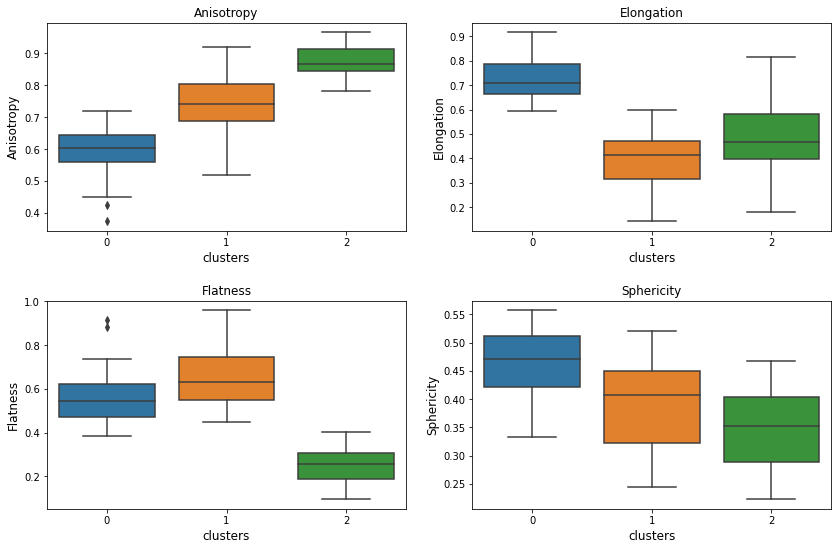

In [57]:
fig = plt.figure(figsize=(12,8))

plt.subplot(2, 2, 1)
sns.boxplot(data=df_segm_pca, x='PcaClusters',  y='Anisotropy')
plt.title("Anisotropy")
plt.xlabel('clusters', {'size':12})
plt.ylabel('Anisotropy', {'size':12})

plt.subplot(2, 2, 2)
sns.boxplot(data=df_segm_pca, x='PcaClusters',  y='Elongation')
plt.title("Elongation")
plt.xlabel('clusters', {'size':12})
plt.ylabel('Elongation', {'size':12})

plt.subplot(2, 2, 3)
sns.boxplot(data=df_segm_pca, x='PcaClusters',  y='Flatness')
plt.title("Flatness")
plt.xlabel('clusters', {'size':12})
plt.ylabel('Flatness', {'size':12})

plt.subplot(2, 2, 4)
sns.boxplot(data=df_segm_pca, x='PcaClusters',  y='Sphericity')
plt.title("Sphericity")
plt.xlabel('clusters', {'size':12})
plt.ylabel('Sphericity', {'size':12})
plt.tight_layout(pad=2)
plt.show()

In [58]:
# number of clustersdf_segm_pca.groupby('PcaClusters')
df_mean_segm_pca['CountThreeSegment'] = df_segm_pca[['PcaClusters','Sphericity']].groupby(['PcaClusters']).count()

### three clusters: 0: 19 particles, 1: 25 particles, 2: 25 particles

In [59]:
df_mean_segm_pca

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,Sphericity,Component 1,Component 2,CountThreeSegment
PcaClusters,,,,,,,,,,,
0,9.181104,-1245.360526,-1243.791053,-1674.727895,0.590278,0.726338,0.573164,0.462748,1.703824,-0.554803,19
1,4.921554,-1246.346400,-1248.516000,-1680.404400,0.740282,0.392625,0.667039,0.393894,0.104483,1.035428,25
2,7.957426,-1247.609200,-1250.641600,-1665.011600,0.879977,0.497008,0.251447,0.357618,-1.399389,-0.613779,25


C:\Users\hamro\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



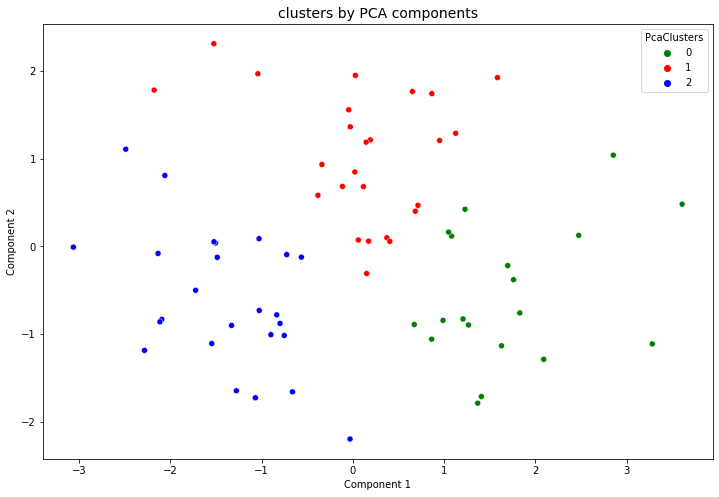

In [60]:
x_axis = df_segm_pca['Component 1']
y_axis = df_segm_pca['Component 2']
fig = plt.figure(figsize=(12,8))
sns.scatterplot(x_axis,y_axis,hue=df_segm_pca['PcaClusters'], palette=['g','r','b'])
plt.title("clusters by PCA components", size=14)
plt.show()

In [172]:
df_segm_pca

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,Sphericity,Component 1,Component 2,PcaClusters
0,91.75290,-1249.26,-1243.58,-1685.28,0.545994,0.731435,0.620706,0.401975,1.697843,-0.217905,0
1,33.28520,-1241.94,-1257.46,-1686.12,0.946436,0.566783,0.094506,0.285816,-2.282130,-1.185457,2
2,26.85760,-1246.98,-1235.86,-1648.17,0.862477,0.343091,0.400835,0.222475,-2.058965,0.809729,2
3,20.57550,-1249.24,-1250.28,-1680.69,0.844642,0.736602,0.210912,0.385156,-0.660838,-1.658739,2
4,17.93760,-1242.87,-1249.47,-1647.25,0.710594,0.471159,0.614242,0.464705,0.684683,0.402733,1
...,...,...,...,...,...,...,...,...,...,...,...
64,2.15399,-1237.99,-1243.50,-1703.01,0.629185,0.754557,0.491434,0.425615,1.207808,-0.826990,0
65,2.10846,-1250.47,-1256.48,-1666.34,0.687320,0.597981,0.522894,0.334487,0.173352,0.060980,1
66,2.09733,-1260.04,-1242.14,-1665.96,0.603934,0.663882,0.596591,0.501057,1.761530,-0.378960,0
67,2.07964,-1243.71,-1244.93,-1637.44,0.741252,0.371061,0.697319,0.399350,0.146331,1.189949,1


In [167]:
import plotly.express as px

fig = px.scatter_3d(df_segm_pca, x='BaryCenterX (mm) ', y='BaryCenterY (mm) ', z='BaryCenterZ (mm) ',
              color='PcaClusters', symbol='PcaClusters', opacity=0.7)
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

### as we can see above there is slightly distinguished yellow cluster number 2, typical of high value of anisotropy, mean (0,89)

# 2.3. clustering - particles greater than or equal to 1 mm^3 

### trying to gain more insight into these clusters we can try to include all particles with volume greater than or equal to 2 mm^3

### all particles greater than or equal to 1 mm^3 clustering using PCA on their physical attributes

In [63]:
particles_over_1 = all_particles[all_particles['Volume3d (mm^3) '] > 1]

In [64]:
physical_features_1 = particles_over_1[['Anisotropy', 'Elongation', 'Flatness','Sphericity']]
scaler = StandardScaler()
physical_features_scaled_ = scaler.fit_transform(physical_features_1)

In [65]:
physical_features_scaled_

array([[-1.5660082 ,  1.13293305,  0.59333438, -0.21215505],
       [ 1.58250012,  0.22499242, -1.956182  , -1.60010257],
       [ 0.92236554, -1.00851252, -0.47197234, -2.35694302],
       [ 0.78213638,  1.16142544, -1.39217668, -0.41312541],
       [-0.2718271 , -0.30230706,  0.56201536,  0.53738517],
       [-0.48502103,  1.1154086 , -0.30824038, -0.15451719],
       [ 1.33624403,  0.0417081 , -1.64324236, -1.65278695],
       [ 0.66013268,  0.3023746 , -0.98864399, -0.61476226],
       [ 1.05899364, -0.31181372, -1.17402406,  0.19515138],
       [ 1.38669822, -2.10923861,  0.23570459, -1.72577182],
       [-1.32920294,  0.88067585,  0.58115368, -1.0327862 ],
       [-0.13940548, -0.09983849,  0.18618721,  0.21030422],
       [ 1.23657793, -0.47168984, -1.34084722, -0.81692215],
       [-0.67572011, -0.4914586 ,  1.36543234, -0.01667645],
       [-0.72361896,  2.04966348, -0.54189262,  0.49498376],
       [ 0.23100865, -0.11585753, -0.25087872,  0.64854361],
       [ 0.12305539, -0.

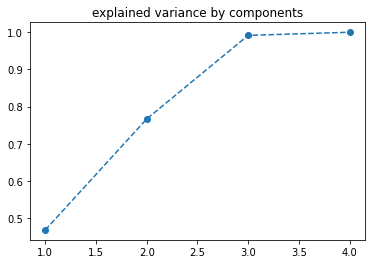

In [66]:
pca_ = PCA()
pca_.fit(physical_features_scaled_)
plt.title("explained variance by components")
plt.plot(range(1,5), pca_.explained_variance_ratio_.cumsum(), marker='o', linestyle='--')
plt.show()

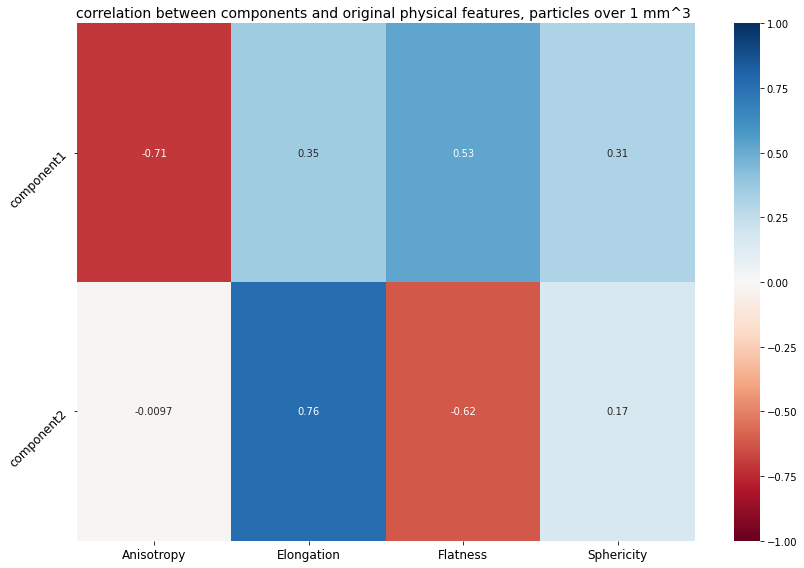

In [67]:
pca_ = PCA(n_components=2)
pca_.fit_transform(physical_features_scaled_)
loadings_ = pd.DataFrame(data=pca_.components_,
                       columns=physical_features_1.columns,
                       index=['component1','component2'])
fig = plt.figure(figsize=(12,8))
sns.heatmap(loadings_, cmap='RdBu', annot=True, vmin=-1, vmax=1)
plt.title("correlation between components and original physical features, particles over 1 mm^3 ", size=14)
plt.yticks(rotation=45, size=12)
plt.xticks(size=12)
plt.tight_layout()
plt.show()

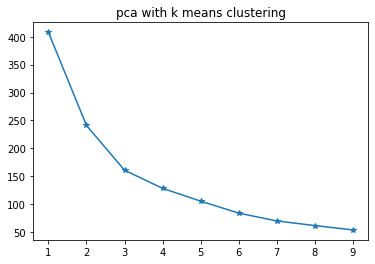

In [68]:
scores_pca_ = pca_.fit_transform(physical_features_scaled_)
wcss_clust_pca_ = []
for i in range(1,10):
    kmeans = KMeans(i, init="k-means++", random_state=42)
    kmeans.fit(scores_pca_)
    wcss_clust_pca_.append(kmeans.inertia_)
plt.plot(range(1,10), wcss_clust_pca_, marker = '*')
plt.title("pca with k means clustering")
plt.show()

### again choosing 3 clusters

In [69]:
k_means_physical_ = KMeans(n_clusters=3, init="k-means++", random_state=42)
k_means_physical_.fit(scores_pca_)

KMeans(n_clusters=3, random_state=42)

In [70]:
k_means_physical_.labels_

array([2, 0, 0, 0, 1, 2, 0, 0, 0, 1, 2, 1, 0, 1, 2, 1, 1, 1, 2, 0, 0, 2,
       1, 0, 0, 1, 0, 0, 0, 1, 1, 1, 2, 0, 0, 2, 0, 1, 1, 1, 0, 0, 2, 2,
       2, 2, 2, 2, 1, 0, 1, 1, 1, 0, 1, 2, 1, 2, 0, 2, 1, 1, 0, 0, 2, 1,
       2, 1, 0, 0, 0, 2, 1, 0, 1, 1, 1, 0, 0, 1, 0, 2, 1, 1, 1, 1, 2, 1,
       1, 2, 0, 0, 1, 2, 2, 0, 0, 2, 2, 1, 1, 1, 0, 1, 2, 0, 1, 0, 0, 1,
       1, 0, 2, 1, 2, 2, 0, 0, 2, 2, 2, 2, 2, 2, 2, 1, 2, 0, 2, 2, 1, 2,
       1])

In [71]:
scores_pca_

array([[ 1.75690042e+00,  4.72780086e-01],
       [-2.56754719e+00,  1.10348903e+00],
       [-1.98661812e+00, -8.85923456e-01],
       [-1.00607094e+00,  1.67612811e+00],
       [ 5.48219592e-01, -4.86792538e-01],
       [ 5.27123498e-01,  1.02123594e+00],
       [-2.30900054e+00,  7.61878451e-01],
       [-1.07213201e+00,  7.36029944e-01],
       [-1.41873762e+00,  5.17691318e-01],
       [-2.13634952e+00, -2.06359115e+00],
       [ 1.23995645e+00,  1.45627575e-01],
       [ 2.26718214e-01, -1.55041316e-01],
       [-2.00167386e+00,  3.25359296e-01],
       [ 1.01969537e+00, -1.22292875e+00],
       [ 1.10335498e+00,  1.99265036e+00],
       [-1.36290135e-01,  1.76631010e-01],
       [-1.80399562e-01, -7.86449910e-01],
       [ 6.45797605e-01, -4.98035960e-01],
       [ 1.11534474e+00,  1.04736782e+00],
       [-1.49688684e+00,  1.75594065e+00],
       [-1.16901911e+00, -2.00639613e-01],
       [ 1.86224844e+00,  1.46862294e+00],
       [ 2.52886181e-01, -1.24562933e+00],
       [-1.

In [72]:
df_pca_scores_ = pd.DataFrame(scores_pca_, columns=['Component 1', 'Component 2'])

In [73]:


k_means_pca_clusters_ = pd.DataFrame(k_means_physical_.labels_, columns=["PcaClusters"])
df_segm_pca_ = pd.concat([particles_over_1.reset_index(drop=True), df_pca_scores_ , k_means_pca_clusters_], axis=1)

In [179]:
df_segm_pca_

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,VoxelFaceArea (mm^2),Sphericity,SurfaceParticles,Component 1,Component 2,PcaClusters
0,91.75290,-1249.26,-1243.58,-1685.28,0.545994,0.731435,0.620706,244.73600,0.401975,False,1.756900,0.472780,2
1,33.28520,-1241.94,-1257.46,-1686.12,0.946436,0.566783,0.094506,175.07800,0.285816,False,-2.567547,1.103489,0
2,26.85760,-1246.98,-1235.86,-1648.17,0.862477,0.343091,0.400835,194.94600,0.222475,False,-1.986618,-0.885923,0
3,20.57550,-1249.24,-1250.28,-1680.69,0.844642,0.736602,0.210912,94.27890,0.385156,False,-1.006071,1.676128,0
4,17.93760,-1242.87,-1249.47,-1647.25,0.710594,0.471159,0.614242,71.30980,0.464705,False,0.548220,-0.486793,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
128,1.03507,-1238.85,-1242.61,-1697.13,0.606199,0.684806,0.575054,13.58990,0.364123,False,1.074258,0.332892,2
129,1.03052,-1249.60,-1238.66,-1687.48,0.687950,0.629907,0.495391,12.33400,0.400023,False,0.441016,0.409822,2
130,1.00715,-1240.22,-1230.60,-1689.03,0.768647,0.461662,0.501131,9.39435,0.517226,False,0.111476,-0.082127,1
131,1.00496,-1241.06,-1238.86,-1681.39,0.586009,0.802680,0.515760,10.90470,0.444942,False,1.563182,1.174188,2


In [75]:
df_mean_segm_pca_ = df_segm_pca_.groupby('PcaClusters').mean()

In [76]:
df_mean_segm_pca_

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,VoxelFaceArea (mm^2),Sphericity,SurfaceParticles,Component 1,Component 2
PcaClusters,,,,,,,,,,,,
0,5.269345,-1246.889302,-1249.489535,-1669.974419,0.868871,0.516571,0.262788,37.770130,0.388150,0.0,-1.425376,0.598309
1,3.278162,-1245.903333,-1248.813750,-1675.851667,0.752138,0.391549,0.639643,25.457580,0.414491,0.0,0.041122,-1.003934
2,4.874370,-1245.501429,-1245.539048,-1673.814524,0.610548,0.689252,0.577715,25.373691,0.458051,0.0,1.412316,0.534800


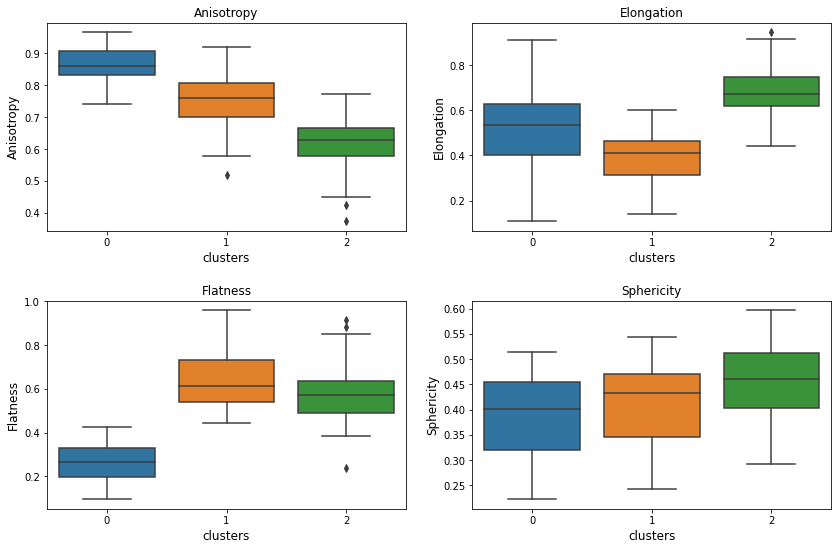

In [77]:
fig = plt.figure(figsize=(12,8))

plt.subplot(2, 2, 1)
sns.boxplot(data=df_segm_pca_, x='PcaClusters',  y='Anisotropy')
plt.title("Anisotropy")
plt.xlabel('clusters', {'size':12})
plt.ylabel('Anisotropy', {'size':12})

plt.subplot(2, 2, 2)
sns.boxplot(data=df_segm_pca_, x='PcaClusters',  y='Elongation')
plt.title("Elongation")
plt.xlabel('clusters', {'size':12})
plt.ylabel('Elongation', {'size':12})

plt.subplot(2, 2, 3)
sns.boxplot(data=df_segm_pca_, x='PcaClusters',  y='Flatness')
plt.title("Flatness")
plt.xlabel('clusters', {'size':12})
plt.ylabel('Flatness', {'size':12})

plt.subplot(2, 2, 4)
sns.boxplot(data=df_segm_pca_, x='PcaClusters',  y='Sphericity')
plt.title("Sphericity")
plt.xlabel('clusters', {'size':12})
plt.ylabel('Sphericity', {'size':12})
plt.tight_layout(pad=2)
plt.show()

In [168]:
import plotly.express as px

fig = px.scatter_3d(df_segm_pca_, x='BaryCenterX (mm) ', y='BaryCenterY (mm) ', z='BaryCenterZ (mm) ',
              color='PcaClusters', symbol='PcaClusters', opacity=0.6)
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

### as we can see above if considering particles greater than or equal to 1 mm^3, no significant cluster appear

# 3. Slicing venus based on vertical coordinates and exploring each slice

### total height of the figurine is (cca 114.099 mm), figure was dived into 6 even parts (cca 19.016 mm) along vertical axis, using BarycenterZ coordinates


In [79]:
import plotly.express as px

fig = px.scatter_3d(all_particles, x='BaryCenterX (mm) ', y='BaryCenterY (mm) ', z='BaryCenterZ (mm) ', opacity=0.6)
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

In [80]:
very_bottom_part = all_particles['BaryCenterZ (mm) '].min()
very_upper_part = all_particles['BaryCenterZ (mm) '].max()

In [108]:
range_z = abs(very_bottom_part) - abs(very_upper_part)
part = range_z/6
print(f"height {range_z}")
print(f"one part height {part}")

height 114.09999999999991
one part height 19.01666666666665


In [83]:
# creating all parts
first = (very_bottom_part, very_bottom_part + part)
second = (first[1], first[1] + part)
third = (second[1], second[1] + part)
fourth = (third[1], third[1] + part)
fifth = (fourth[1], fourth[1] + part)
sixth = (fifth[1], fifth[1] + part)

all_parts = [first, second, third, fourth, fifth, sixth]

### intervals for all designated slices

In [147]:
all_parts[::-1]

[(-1636.6866666666667, -1617.67),
 (-1655.7033333333334, -1636.6866666666667),
 (-1674.72, -1655.7033333333334),
 (-1693.7366666666667, -1674.72),
 (-1712.7533333333333, -1693.7366666666667),
 (-1731.77, -1712.7533333333333)]

In [85]:
all_particles_parts = []
for part in all_parts[::-1]:
    all_particles_parts.append(all_particles[(all_particles['BaryCenterZ (mm) '] >= part[0]) & (all_particles['BaryCenterZ (mm) '] <= part[1])])

### very top (head) - part 1

In [86]:
part_1 = all_particles_parts[0]
part_1.describe()

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,VoxelFaceArea (mm^2),Sphericity
count,10262.000000,10262.000000,10262.000000,10262.000000,10262.000000,10262.000000,10262.000000,10262.000000,10262.000000
mean,0.005425,-1246.557975,-1248.402321,-1628.567112,0.694496,0.412995,0.363506,0.118019,0.660916
std,0.095298,3.464295,3.071000,4.889973,0.386088,0.378781,0.514893,0.822170,0.079196
min,0.000007,-1254.640000,-1255.920000,-1636.680000,-1.000000,-1.000000,-1.000000,0.002151,0.211992
25%,0.000048,-1249.150000,-1250.690000,-1632.680000,0.623181,0.249931,0.216478,0.009320,0.617429
50%,0.000183,-1246.795000,-1248.470000,-1628.870000,0.783372,0.451832,0.491374,0.024374,0.660833
75%,0.000672,-1243.850000,-1246.122500,-1624.740000,0.904537,0.657428,0.699558,0.059502,0.707021
max,7.347280,-1237.990000,-1240.860000,-1617.670000,1.000000,0.999919,1.000000,46.027800,0.805997


In [87]:
count_over_1 = part_1[part_1['Volume3d (mm^3) '] > 2].count()[0]
res_1 = round(count_over_1/part_1.count()[0]*100,3)
print(f"in first part only {res_1} % particles are larger than 0.1 mm^3 ")

in first part only 0.039 % particles are larger than 0.1 mm^3 


### part 2 upper torso

In [88]:
part_2 = all_particles_parts[1]
part_2.describe()

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,VoxelFaceArea (mm^2),Sphericity
count,17142.000000,17142.000000,17142.000000,17142.000000,17142.000000,17142.000000,17142.000000,17142.000000,17142.000000
mean,0.011573,-1246.419391,-1248.208249,-1647.486087,0.697093,0.428800,0.350486,0.154942,0.662480
std,0.331032,3.076190,6.975334,5.213213,0.377345,0.373879,0.510058,2.211765,0.080122
min,0.000007,-1256.190000,-1265.670000,-1655.700000,-1.000000,-1.000000,-1.000000,0.002151,0.210321
25%,0.000041,-1248.660000,-1253.140000,-1651.990000,0.620390,0.260574,0.201926,0.008603,0.620853
50%,0.000149,-1246.380000,-1248.230000,-1647.930000,0.776863,0.469232,0.471563,0.020790,0.664293
75%,0.000529,-1244.000000,-1243.180000,-1643.450000,0.907883,0.667070,0.680712,0.049466,0.707043
max,26.857600,-1238.690000,-1232.030000,-1636.690000,1.000000,0.999919,1.000000,194.946000,0.805997


In [89]:
count_over_2 = part_2[part_2['Volume3d (mm^3) '] > 2].count()[0]
res_2 = round(count_over_2/part_2.count()[0]*100,3)
print(f"in second part only {res_2} % particles are larger than 0.1 mm^3 ")

in second part only 0.082 % particles are larger than 0.1 mm^3 


### part 3 - belly and breasts

In [90]:
part_3 = all_particles_parts[2]
part_3.describe()

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,VoxelFaceArea (mm^2),Sphericity
count,27812.000000,27812.000000,27812.000000,27812.000000,27812.000000,27812.000000,27812.000000,27812.000000,27812.000000
mean,0.007908,-1247.887187,-1247.471837,-1665.837904,0.682229,0.436214,0.335999,0.137669,0.658013
std,0.166526,5.373476,8.251930,5.465757,0.402690,0.393944,0.509167,1.166347,0.080487
min,0.000007,-1262.260000,-1267.530000,-1674.720000,-1.000000,-1.000000,-1.000000,0.002151,0.243926
25%,0.000048,-1251.900000,-1254.440000,-1670.600000,0.610563,0.285205,0.185887,0.008603,0.613080
50%,0.000163,-1247.680000,-1246.710000,-1666.175000,0.773096,0.499411,0.453831,0.021507,0.660065
75%,0.000604,-1243.820000,-1241.000000,-1661.250000,0.904845,0.680393,0.666915,0.055201,0.707021
max,16.360700,-1234.030000,-1227.770000,-1655.710000,1.000000,0.999919,1.000000,83.427600,0.805997


In [91]:
count_over_3 = part_3[part_3['Volume3d (mm^3) '] > 2].count()[0]
res_3 = round(count_over_3/part_3.count()[0]*100,3)
print(f"in second part only {res_3} % particles are larger than 0.1 mm^3 ")

in second part only 0.072 % particles are larger than 0.1 mm^3 


### part 4 - bottom part of belly and bottom 

In [92]:
part_4 = all_particles_parts[3]
part_4.describe()

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,VoxelFaceArea (mm^2),Sphericity
count,23683.000000,23683.000000,23683.000000,23683.000000,23683.000000,23683.000000,23683.000000,23683.000000,23683.000000
mean,0.014307,-1245.832862,-1244.941928,-1682.686778,0.660273,0.435814,0.293013,0.173844,0.655450
std,0.657165,5.621560,10.259573,5.448225,0.455162,0.436807,0.515325,2.266253,0.081953
min,0.000007,-1259.100000,-1269.460000,-1693.730000,-1.000000,-1.000000,-1.000000,0.002151,0.174676
25%,0.000048,-1250.510000,-1253.230000,-1687.190000,0.607987,0.316045,0.140945,0.009319,0.610433
50%,0.000163,-1245.860000,-1243.900000,-1681.580000,0.776442,0.513000,0.411881,0.022224,0.658454
75%,0.000628,-1241.200000,-1236.020000,-1678.130000,0.911574,0.702300,0.627665,0.057352,0.707018
max,91.752900,-1233.450000,-1225.980000,-1674.720000,1.000000,0.999980,1.000000,244.736000,0.805997


In [93]:
count_over_4 = part_4[part_4['Volume3d (mm^3) '] > 2].count()[0]
res_4 = round(count_over_4/part_4.count()[0]*100,3)
print(f"in second part only {res_4} % particles are larger than 0.1 mm^3 ")

in second part only 0.063 % particles are larger than 0.1 mm^3 


### part 5: upper part of legs

In [94]:
part_5 = all_particles_parts[4]
part_5.describe()

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,VoxelFaceArea (mm^2),Sphericity
count,16587.000000,16587.000000,16587.000000,16587.000000,16587.000000,16587.000000,16587.000000,16587.000000,16587.000000
mean,0.007997,-1245.845139,-1246.627532,-1702.859876,0.663054,0.459394,0.319604,0.136685,0.656183
std,0.145740,3.962872,6.345024,5.457670,0.432962,0.424656,0.494787,1.029505,0.077958
min,0.000007,-1255.450000,-1263.140000,-1712.750000,-1.000000,-1.000000,-1.000000,0.002151,0.271719
25%,0.000054,-1249.130000,-1251.820000,-1707.530000,0.602599,0.333270,0.171964,0.010037,0.612787
50%,0.000183,-1245.890000,-1246.470000,-1702.710000,0.764311,0.532567,0.438477,0.023657,0.656347
75%,0.000645,-1242.570000,-1241.130000,-1698.080000,0.899015,0.723497,0.633601,0.058068,0.704103
max,8.926760,-1236.750000,-1232.320000,-1693.740000,1.000000,0.999955,1.000000,47.584900,0.805997


In [95]:
count_over_5 = part_5[part_5['Volume3d (mm^3) '] > 2].count()[0]
res_5 = round(count_over_5/part_5.count()[0]*100,3)
print(f"in second part only {res_5} % particles are larger than 0.1 mm^3 ")

in second part only 0.072 % particles are larger than 0.1 mm^3 


### lower part of legs, part 6   

In [96]:
part_6 = all_particles_parts[5]
part_6.describe()

,Volume3d (mm^3),BaryCenterX (mm),BaryCenterY (mm),BaryCenterZ (mm),Anisotropy,Elongation,Flatness,VoxelFaceArea (mm^2),Sphericity
count,7046.000000,7046.000000,7046.000000,7046.000000,7046.000000,7046.000000,7046.000000,7046.000000,7046.000000
mean,0.007143,-1245.257610,-1245.954489,-1718.462267,0.660241,0.469356,0.330794,0.139183,0.656312
std,0.104226,3.246921,4.492561,3.860653,0.421707,0.418355,0.489197,1.020935,0.078268
min,0.000007,-1253.260000,-1256.650000,-1731.770000,-1.000000,-1.000000,-1.000000,0.002151,0.167262
25%,0.000061,-1247.827500,-1250.170000,-1721.330000,0.602826,0.341241,0.216774,0.010753,0.614265
50%,0.000204,-1245.300000,-1244.570000,-1717.925000,0.753106,0.542593,0.449330,0.025808,0.657366
75%,0.000692,-1242.600000,-1242.370000,-1715.190000,0.885106,0.728761,0.632880,0.060220,0.703510
max,4.631700,-1237.830000,-1237.340000,-1712.760000,1.000000,0.999919,1.000000,50.540500,0.805997


In [97]:
count_over_6 = part_6[part_6['Volume3d (mm^3) '] > 2].count()[0]
res_6 = round(count_over_6/part_6.count()[0]*100,3)
print(f"in second part only {res_6} % particles are larger than 0.1 mm^3 ")

in second part only 0.057 % particles are larger than 0.1 mm^3 


In [98]:
venus_particle_distrubution_towards_vertical_axis = pd.DataFrame([res_1, res_2,res_3,res_4,res_5,res_6], 
                                                                 columns=["particles over 2 mm^3 [%]"],
                                                                index=['part 1 (head)','part 2','part 3','part 4','part 5','part 6 (legs)'])

### table = ratio of particles with the volume greater than or equal to 2 mm^3 to all particles in a particular part of the venus

In [212]:
venus_particle_distrubution_towards_vertical_axis.values

array([[0.039],
       [0.082],
       [0.072],
       [0.063],
       [0.072],
       [0.057]])

### As we can see above even dividing venus into 6 even vertical parts using BaryCenterZ coordinates, does not bring any significant results regarding distribution larger particles greater than or equal to 2 mm^3

In [100]:
part_1['slice'] = 1
part_2['slice'] = 2
part_3['slice'] = 3
part_4['slice'] = 4
part_5['slice'] = 5
part_6['slice'] = 6

C:\Users\hamro\Anaconda3\lib\site-packages\pandas\core\frame.py:3607: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



### mean values of physical features and volume fo each slice seperately (for all particles)

In [101]:
all_slices = pd.concat([part_1, part_2, part_3, part_4, part_5, part_6], axis=0)
slices_means = all_slices.groupby('slice').mean()[['Volume3d (mm^3) ', 'Anisotropy', 'Elongation', 'Flatness', 'Sphericity']]

In [102]:
slices_means

,Volume3d (mm^3),Anisotropy,Elongation,Flatness,Sphericity
slice,,,,,
1,0.005425,0.694496,0.412995,0.363506,0.660916
2,0.011573,0.697093,0.428800,0.350486,0.662480
3,0.007908,0.682229,0.436214,0.335999,0.658013
4,0.014307,0.660273,0.435814,0.293013,0.655450
5,0.007997,0.663054,0.459394,0.319604,0.656183
6,0.007143,0.660241,0.469356,0.330794,0.656312


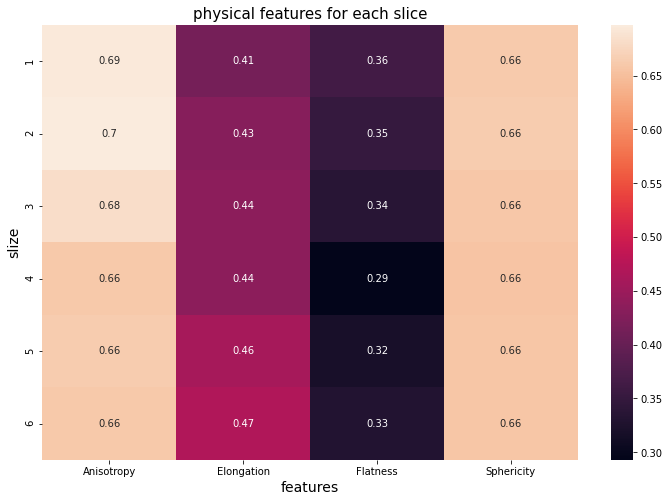

In [116]:
plt.figure(figsize=(12,8))
plt.title("physical features for each slice", {'size':15})
sns.heatmap(slices_means[['Anisotropy', 'Elongation', 'Flatness', 'Sphericity']], annot=True)
plt.ylabel("slize", {'size':14})
plt.xlabel("features", {'size':14})
plt.show()

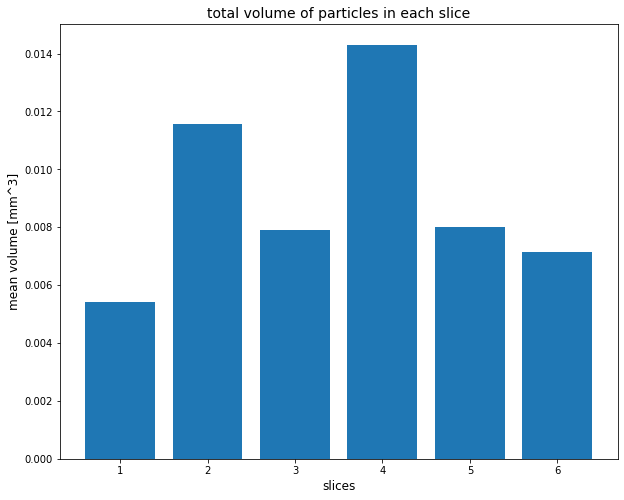

In [143]:
plt.figure(figsize=(10,8))
plt.bar(x=slices_means.index, height=slices_means['Volume3d (mm^3) '])
plt.title("total volume of particles in each slice", {'size':14})
plt.xlabel("slices", {'size':12})
plt.ylabel("mean volume [mm^3]", {'size':12})
plt.show()

### mean values of physical features and volume fo each slice seperately (only for particles with volume greater than or equal to 2 mm^3)

In [110]:
all_slices_part_over_2 = pd.concat([part_1[part_1['Volume3d (mm^3) '] > 2], part_2[part_2['Volume3d (mm^3) '] > 2], part_3[part_3['Volume3d (mm^3) '] > 2], part_4[part_4['Volume3d (mm^3) '] > 2], part_5[part_5['Volume3d (mm^3) '] > 2], part_6[part_6['Volume3d (mm^3) '] > 2]], axis=0)

In [136]:
all_slices_part_over_2_means = all_slices_part_over_2.groupby('slice').mean()[['Volume3d (mm^3) ', 'Anisotropy', 'Elongation', 'Flatness', 'Sphericity']]

In [137]:
count_for_each_slice = all_slices_part_over_2.groupby('slice').count()

In [191]:
final_interval = []
for i in all_parts[::-1]:
    final_interval.append((round(i[1],2), round(i[0],2)))
final_interval

[(-1617.67, -1636.69),
 (-1636.69, -1655.7),
 (-1655.7, -1674.72),
 (-1674.72, -1693.74),
 (-1693.74, -1712.75),
 (-1712.75, -1731.77)]

In [207]:
 venus_particle_distrubution_towards_vertical_axis['particles over 2 mm^3 [%]'].values

array([0.039, 0.082, 0.072, 0.063, 0.072, 0.057])

In [210]:
all_slices_part_over_2_means['No of particles'] = count_for_each_slice['Volume3d (mm^3) ']
all_slices_part_over_2_means['BarycenterZ(range)'] = final_interval
all_slices_part_over_2_means['ration particles over 2 mm^3 to all particles [%]'] = venus_particle_distrubution_towards_vertical_axis['particles over 2 mm^3 [%]'].values
all_slices_part_over_2_means

,Volume3d (mm^3),Anisotropy,Elongation,Flatness,Sphericity,No of particles,BarycenterZ(range),ration particles over 2 mm^3 to all particles [%]
slice,,,,,,,,
1,3.712422,0.701612,0.569758,0.512672,0.388485,4,"(-1617.67, -1636.69)",0.039
2,9.042826,0.783831,0.497701,0.460212,0.366160,14,"(-1636.69, -1655.7)",0.082
3,4.582709,0.767979,0.539119,0.451089,0.406029,20,"(-1655.7, -1674.72)",0.072
4,12.840997,0.750144,0.512394,0.474677,0.394590,15,"(-1674.72, -1693.74)",0.063
5,4.613992,0.724846,0.515641,0.552434,0.439833,12,"(-1693.74, -1712.75)",0.072
6,3.832298,0.657946,0.534601,0.646867,0.395606,4,"(-1712.75, -1731.77)",0.057


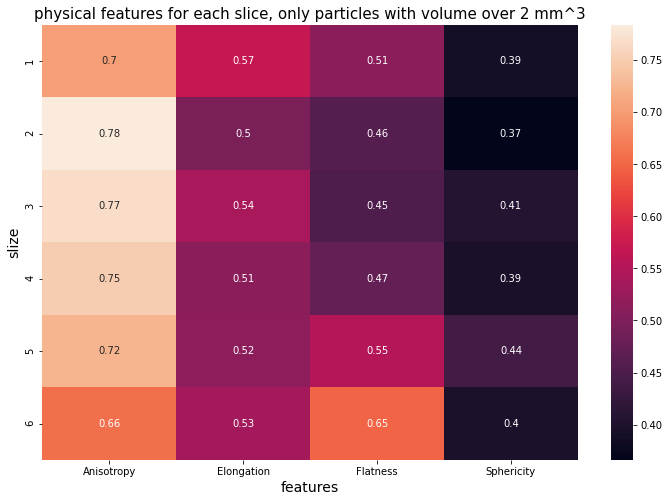

In [119]:
plt.figure(figsize=(12,8))
plt.title("physical features for each slice, only particles with volume over 2 mm^3", {'size':15})
sns.heatmap(all_slices_part_over_2_means[['Anisotropy', 'Elongation', 'Flatness', 'Sphericity']], annot=True)
plt.ylabel("slize", {'size':14})
plt.xlabel("features", {'size':14})
plt.show()

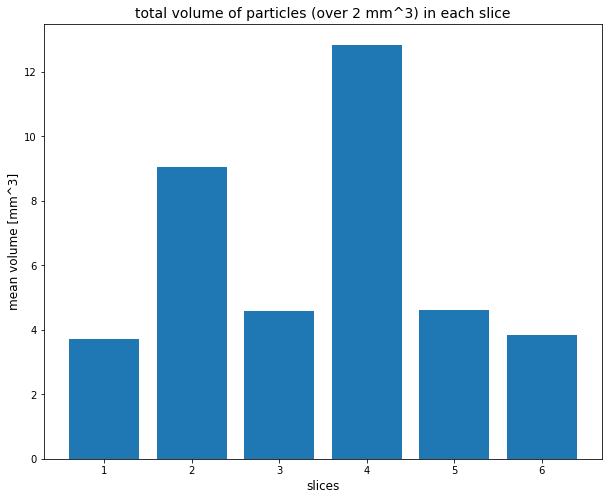

In [144]:
plt.figure(figsize=(10,8))
plt.bar(x=all_slices_part_over_2_means.index, height=all_slices_part_over_2_means['Volume3d (mm^3) '])
plt.title("total volume of particles (over 2 mm^3) in each slice", {'size':14})
plt.xlabel("slices", {'size':12})
plt.ylabel("mean volume [mm^3]", {'size':12})
plt.show()

### venus slices highlighed on 3d plot

In [170]:
import plotly.express as px

fig = px.scatter_3d(all_slices, x='BaryCenterX (mm) ', y='BaryCenterY (mm) ', z='BaryCenterZ (mm) ',
              color='slice', opacity=0.6)
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()
